## Importando as bibliotecas e funções usadas

In [1]:
# Bibliotecas para manipular os dados
import pandas as pd
import numpy as np

# Bibliotecas para fazer o RandomForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from scipy.stats import randint

# Bibliotecas para Hyperparameter tuning e visualizar a performance
from sklearn.metrics import confusion_matrix, precision_score, ConfusionMatrixDisplay, accuracy_score, recall_score, f1_score

# Bibliotecas para ver o modelo gerado
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

## Recebendo o Dataset

In [2]:
data = pd.read_csv('dataset/Cancer_Data.csv')

# Separando as instâncias das suas classificações
values = data.drop('id', axis=1).drop('diagnosis', axis=1).drop('Unnamed: 32', axis=1)
labels = data['diagnosis']

In [3]:
values.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
labels.head()

0    M
1    M
2    M
3    M
4    M
Name: diagnosis, dtype: object

## Normalizando o dataset

In [5]:
#Normalizando os valores antes de realizar o treino
values = (values - np.mean(values, axis=0)) / np.std(values, axis=0)

values.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


## Separando as instâncias em um conjunto de treinamento e um de teste

In [6]:
values_train, values_test, labels_train, labels_test = train_test_split(values, labels, test_size=0.3, random_state=42)

## Escolhendo os melhores parâmetros

O que cada parâmetro indica:

*   **n_estimators**: Define a quantidade de árvores que a Random Forest terá
*   **criterion**: Define as métricas para avaliação da qualidade da divisão dos nós da árvore: gini, entropy ou log loss.
*   **max_features**: Define o número máximo de variáveis que são considerados para cada divisão de nó. A opção "sqrt" define o número de variáveis a ser considerado como a raiz quadrada do número total de variáveis, enquanto "log2" define o número de variáveis a ser considerado como o logaritmo de base 2 do número total de variáveis. A opção "None" indica que todos os variáveis devem ser considerados.
*   **max_depth**: Define a profundidade máxima da árvore.

In [7]:
param_dist = {'n_estimators': range(10, 100),
              'criterion': ['gini', 'entropy', 'log_loss'],
              'max_features': ['sqrt', 'log2'],
              'max_depth': range(1, 20)
            }

rf = RandomForestClassifier()
rand_search = RandomizedSearchCV(rf, param_distributions=param_dist, cv=5)
rand_search.fit(values_train, labels_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': range(1, 20),
                                        'max_features': ['sqrt', 'log2'],
                                        'n_estimators': range(10, 100)})

In [8]:
top5_modelos = pd.DataFrame(rand_search.cv_results_)
top5_modelos = top5_modelos.sort_values(by='mean_test_score', ascending=False)
top5_modelos = top5_modelos.head()
top5_modelos = top5_modelos.loc[:, ['params', 'mean_test_score']]
top5_modelos

,params,mean_test_score
9,"{'n_estimators': 30, 'max_features': 'log2', '...",0.962310
4,"{'n_estimators': 12, 'max_features': 'log2', '...",0.957278
7,"{'n_estimators': 88, 'max_features': 'sqrt', '...",0.957278
3,"{'n_estimators': 93, 'max_features': 'log2', '...",0.954810
6,"{'n_estimators': 62, 'max_features': 'sqrt', '...",0.952247


Com isso, nota-se que apesar de não haver muita diferença entre eles, o primeiro modelo ainda possui a melhor média do cross-validation, sendo o nosso modelo escolhido

## Avaliando a performance do modelo com os parâmetros escolhidos com outras métricas de avaliação

Para avaliar a performance do nosso modelo, iremos usar a acurâcia, a precisão, o recall, o F1-score, a média do cross-validation e a matriz de confusão para avaliar o quão bem o nosso modelo classifica o nosso conjunto de teste.

Considerando a seguinte legenda:
* **TP** = True Positive, ou seja, as instâncias positivas que foram corretamente classificadas como positivas
* **TN** = True Negative, ou seja, as instâncias negativas que foram corretamente classificadas como negativas
* **FP** = False Positive, ou seja, as instâncias negativas que foram classificadas como positivas
* **FN** = False Negative, ou seja, as instâncias positivas que foram classificadas como negativas

Temos que:
* **Acurâcia**: Mede a proporção de instâncias que são classificadas corretamente, ou seja, é a quantidade de instâncias classificadas corretamente dividido pela quantidade total de instâncias no conjunto de testes, sendo calculada como (TP + TN) / (TP + TN + FP + FN)
* **Precisão**: Mede a proporção de instâncias que foram corretamente classificadas como positivas, ou seja, é a quantidade de instâncias positivas classificadas como positivas dividido pela quantidade de instâncias que foram classificadas como positivas, sendo calculado como TP / (TP + FP)
* **Recall**: Mede a proporção de instâncias positivas que são classificadas como positivas, sendo calculado como TP / (TP + FN)
* **F1-Score**: É a média harmônica da precisão e do recall, sendo calculada como 2 * (precisão * recall) / (precisão + recall)

Modelo 0:
Parametros: {'n_estimators': 30, 'max_features': 'log2', 'max_depth': 16, 'criterion': 'entropy'}
Média do cross-validation do teste: 0.953109243697479
Acurâcia do teste: 0.9766081871345029
Precisão do teste: 0.9727272727272728
Sensibilidade (recall) do teste: 0.9907407407407407
F1-Score do teste: 0.981651376146789

Modelo 1:
Parametros: {'n_estimators': 12, 'max_features': 'log2', 'max_depth': 18, 'criterion': 'entropy'}
Média do cross-validation do teste: 0.9472268907563025
Acurâcia do teste: 0.9590643274853801
Precisão do teste: 0.954954954954955
Sensibilidade (recall) do teste: 0.9814814814814815
F1-Score do teste: 0.9680365296803655

Modelo 2:
Parametros: {'n_estimators': 88, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'gini'}
Média do cross-validation do teste: 0.953109243697479
Acurâcia do teste: 0.9649122807017544
Precisão do teste: 0.9636363636363636
Sensibilidade (recall) do teste: 0.9814814814814815
F1-Score do teste: 0.9724770642201834

Modelo 3:
Paramet

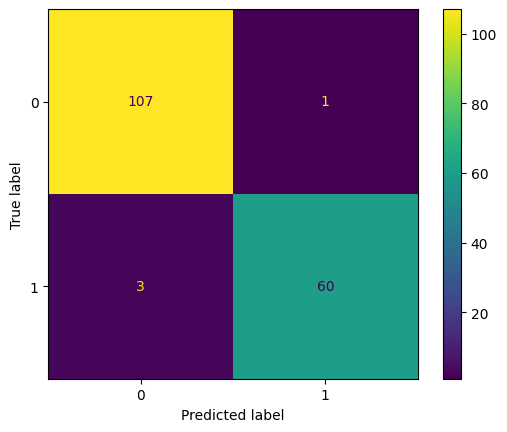

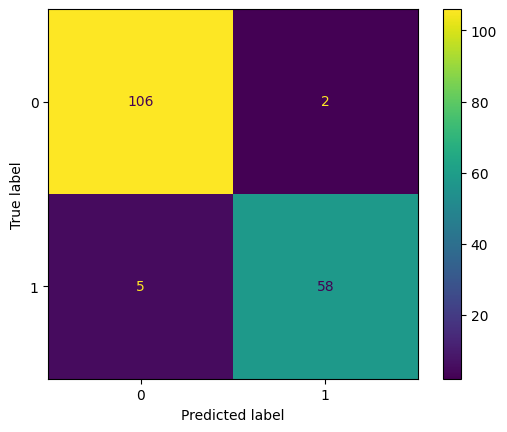

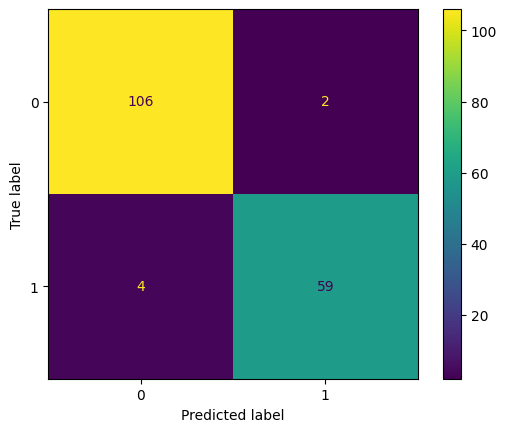

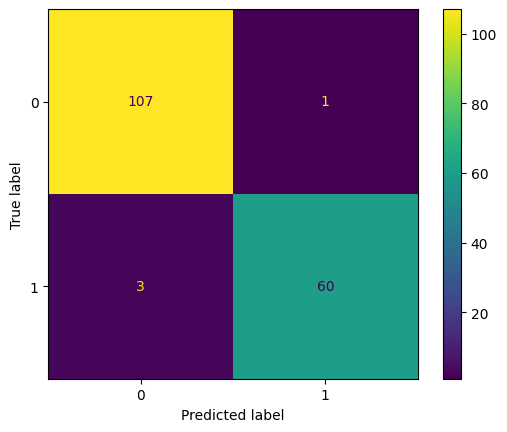

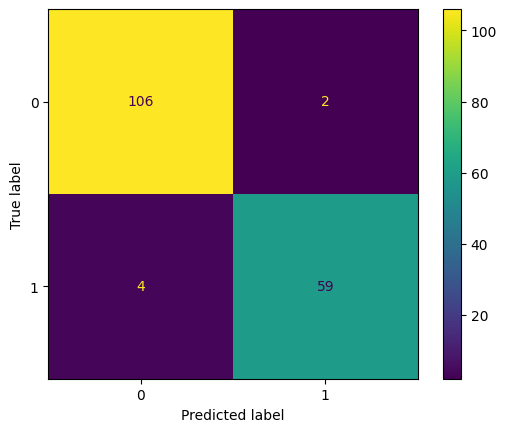

In [9]:
for i, params in enumerate(top5_modelos['params']):
    best_rf = RandomForestClassifier(**params)
    cross_val_score(best_rf, values_train, labels_train, cv=5)
    best_rf.fit(values_train, labels_train)
    labels_pred = best_rf.predict(values_test)
    cm = confusion_matrix(labels_test, labels_pred)
    print(f"Modelo {i}:")
    print(f"Parametros: {params}")
    print(f"Média do cross-validation do teste: {np.mean(cross_val_score(best_rf, values_test, labels_test, cv=5))}")
    print(f"Acurâcia do teste: {accuracy_score(labels_test, labels_pred)}")
    print(f"Precisão do teste: {precision_score(labels_test, labels_pred, pos_label='B')}")
    print(f"Sensibilidade (recall) do teste: {recall_score(labels_test, labels_pred, pos_label='B')}")
    print(f"F1-Score do teste: {f1_score(labels_test, labels_pred, pos_label='B')}\n")
    ConfusionMatrixDisplay(confusion_matrix=cm).plot()

Portanto, nota-se que o melhor modelo entre os 5 é o primeiro modelo, que chamamos de modelo 0

In [17]:
best_rf = rand_search.best_estimator_

print(f"Os melhores parâmetros são: {rand_search.best_params_}")
print(f"Com a média do cross-validation do treinamento sendo {rand_search.best_score_}")

Os melhores parâmetros são: {'n_estimators': 30, 'max_features': 'log2', 'max_depth': 16, 'criterion': 'entropy'}
Com a média do cross-validation do treinamento sendo 0.9623101265822784


Média do cross-validation do teste: 0.9472268907563025
Acurâcia do teste: 0.9766081871345029
Precisão do teste: 0.9727272727272728
Sensibilidade (recall) do teste: 0.9907407407407407
F1-Score do teste: 0.981651376146789


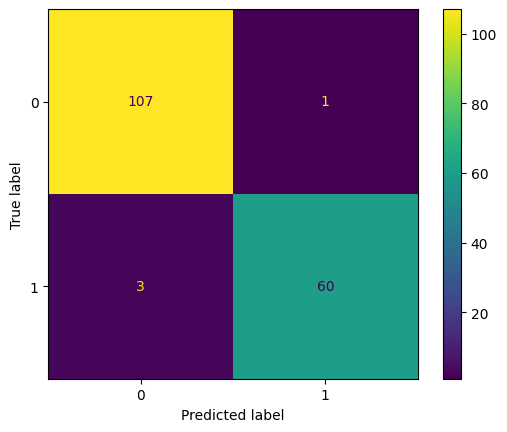

In [18]:
labels_pred = best_rf.predict(values_test)
cm = confusion_matrix(labels_test, labels_pred)
print(f"Média do cross-validation do teste: {np.mean(cross_val_score(best_rf, values_test, labels_test, cv=5))}")
print(f"Acurâcia do teste: {accuracy_score(labels_test, labels_pred)}")
print(f"Precisão do teste: {precision_score(labels_test, labels_pred, pos_label='B')}")
print(f"Sensibilidade (recall) do teste: {recall_score(labels_test, labels_pred, pos_label='B')}")
print(f"F1-Score do teste: {f1_score(labels_test, labels_pred, pos_label='B')}")
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

Portando, como a diferença entre a média do cross-validation do conjunto de treinamento e do conjunto de teste é muito pequeno, e as outras métricas de avaliação da performace do modelo em classificar os dados de teste indicam uma boa performance e não apresentam diferenças significativas, podemos dizer que houve uma pequena quantidade de overfitting, que ainda pode ser considerada aceitável, visto que a matriz de confusão mostra que a maioria das instâncias foram classificadas corretamente, com apenas 4 delas classificadas errado.

## Mostrando a Random Forest

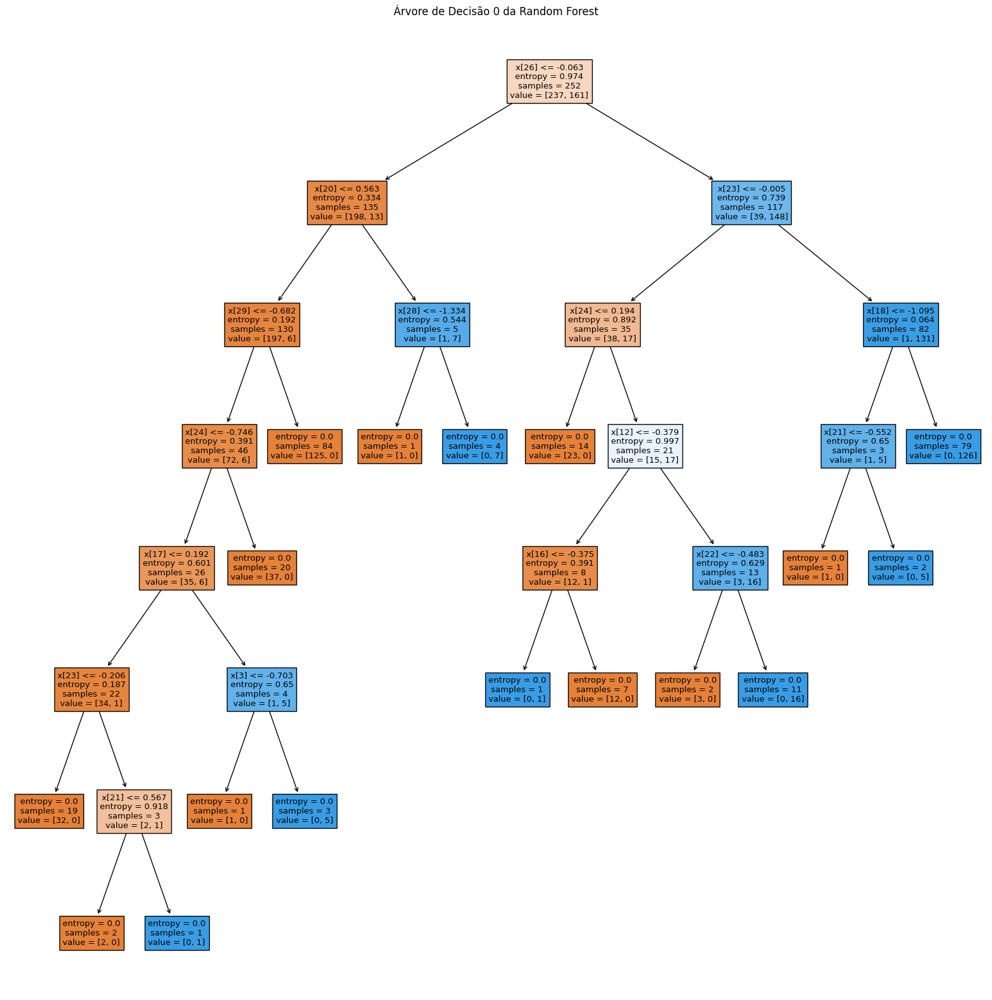

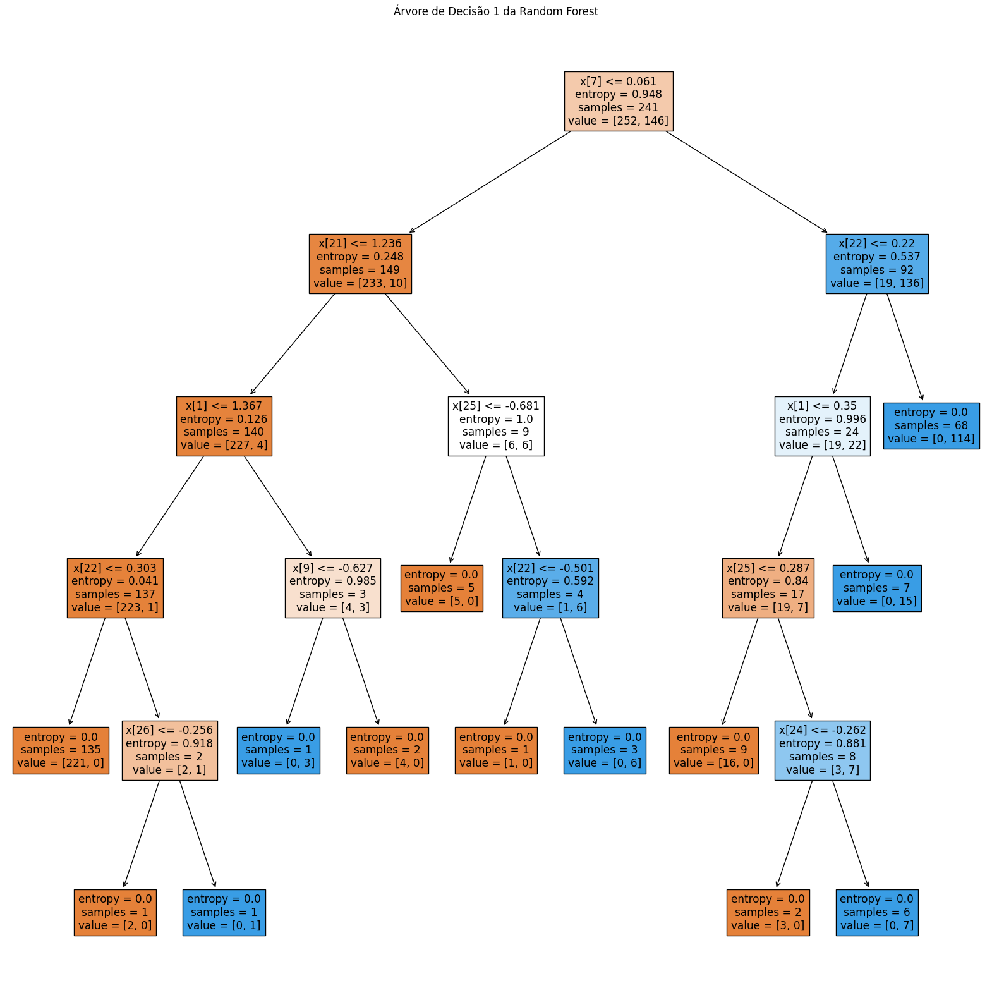

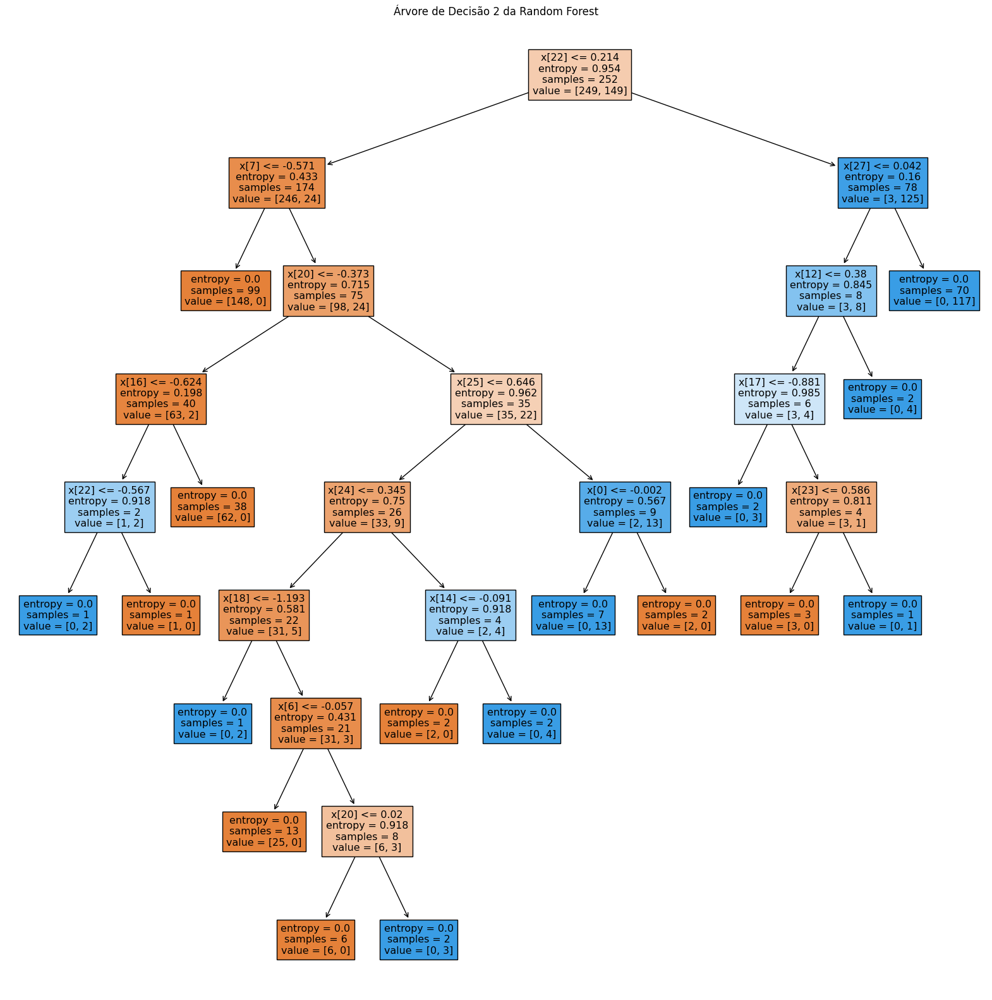

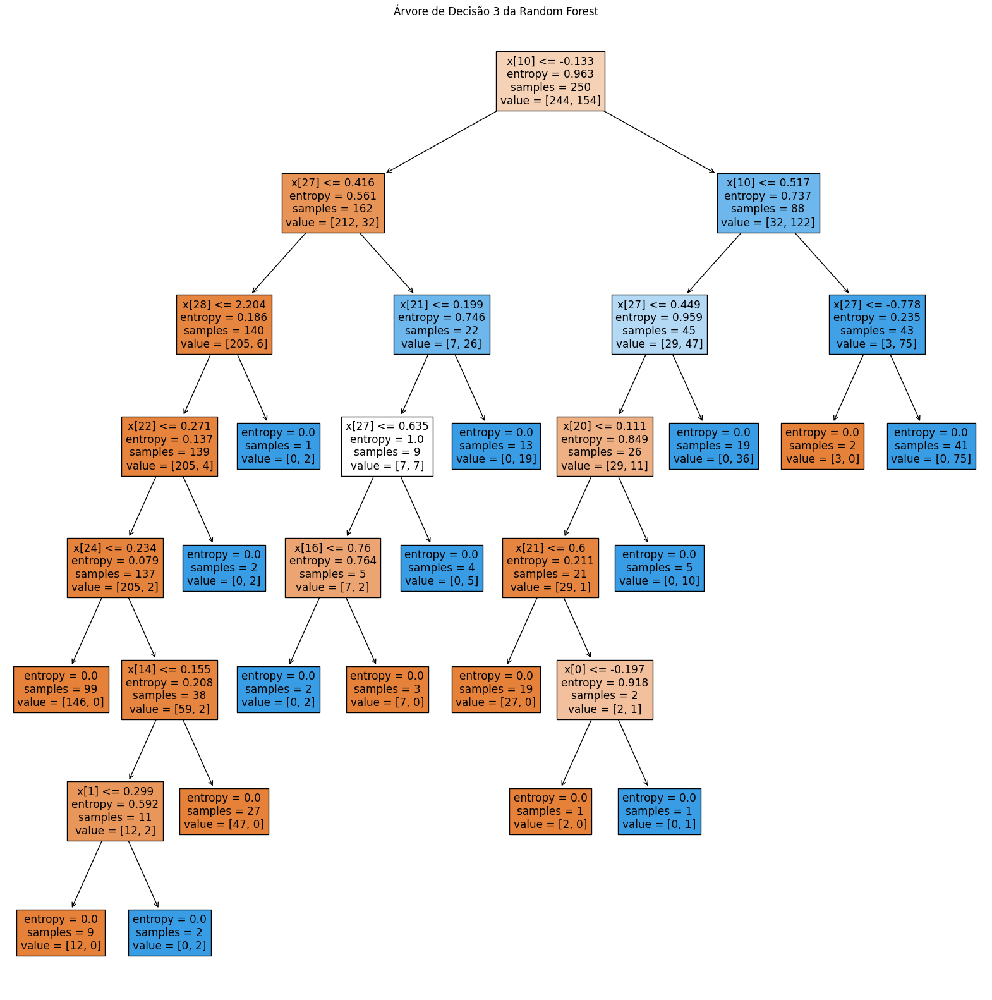

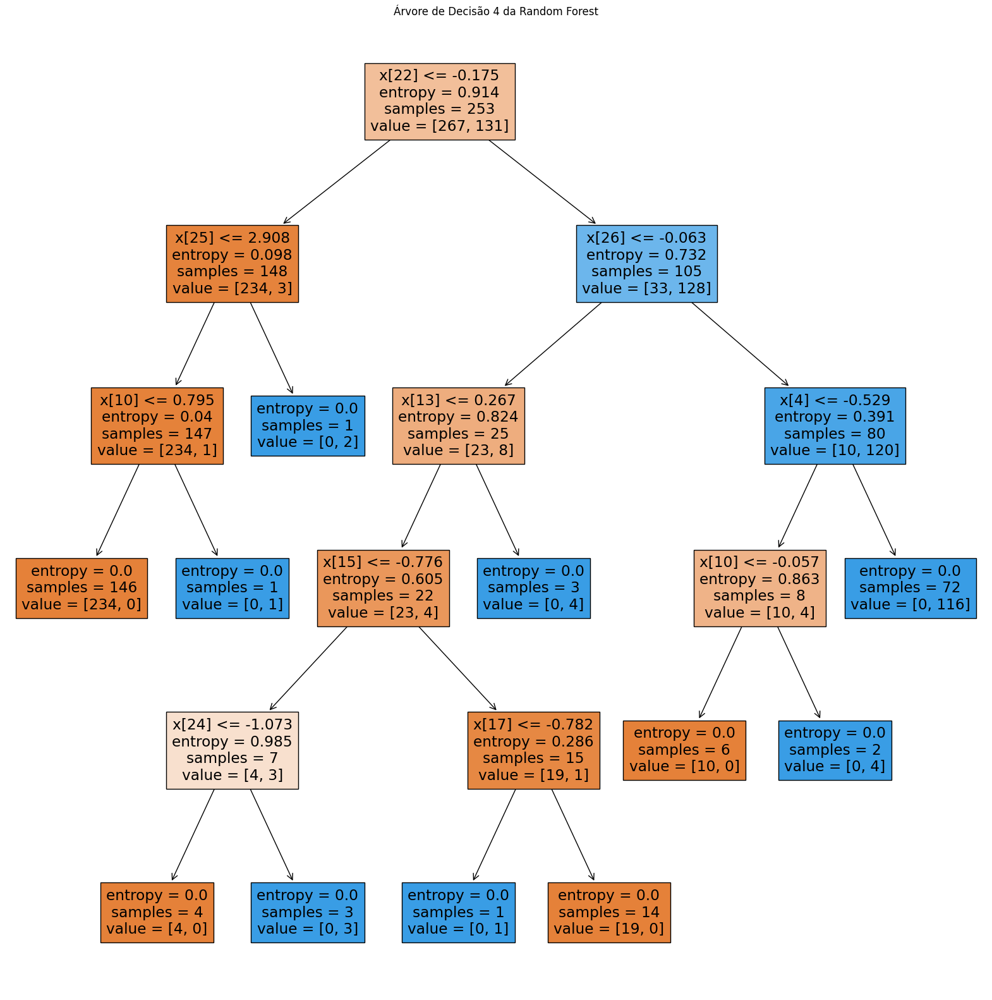

...

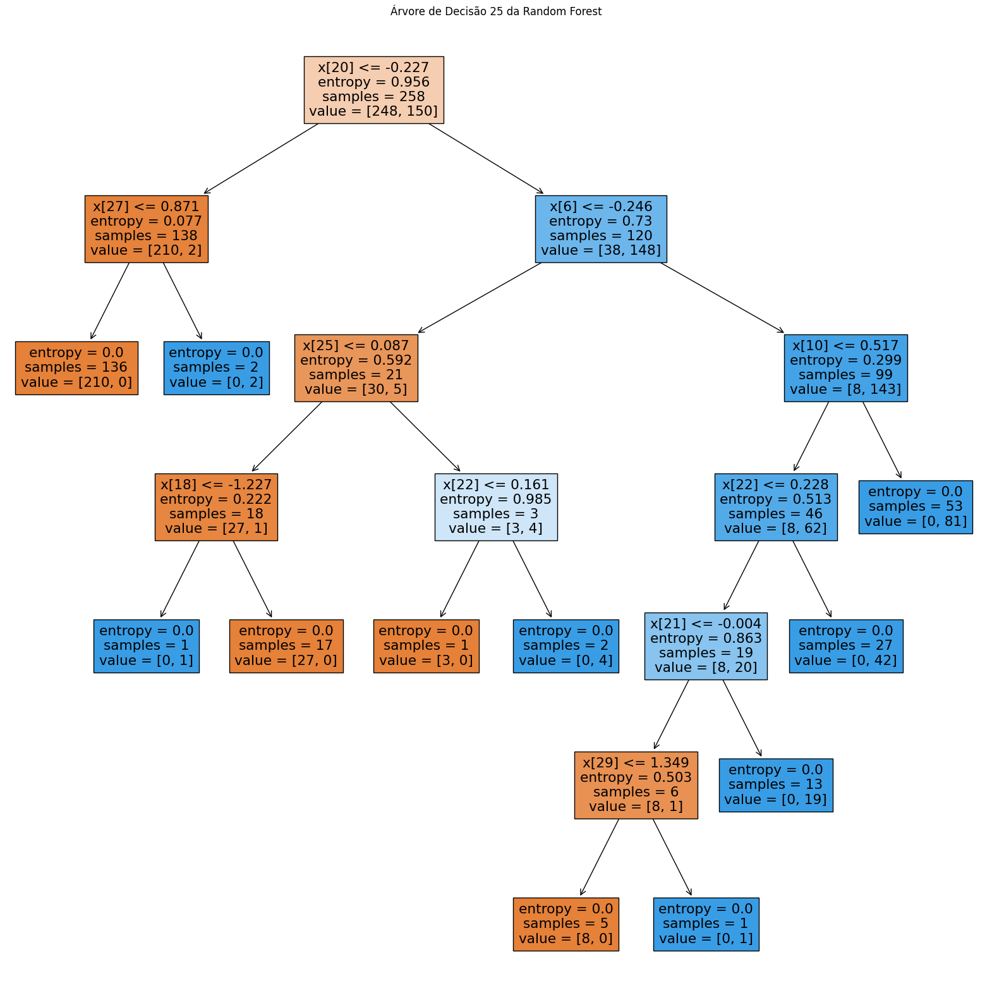

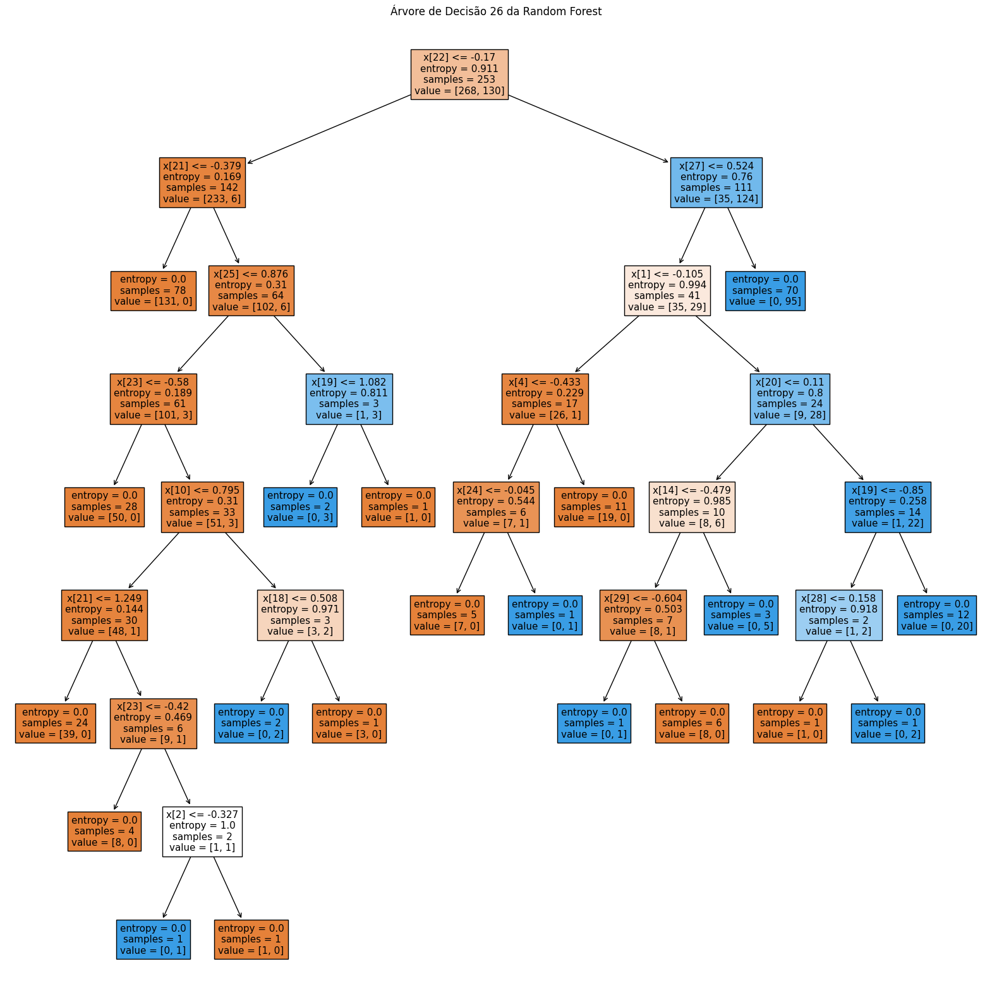

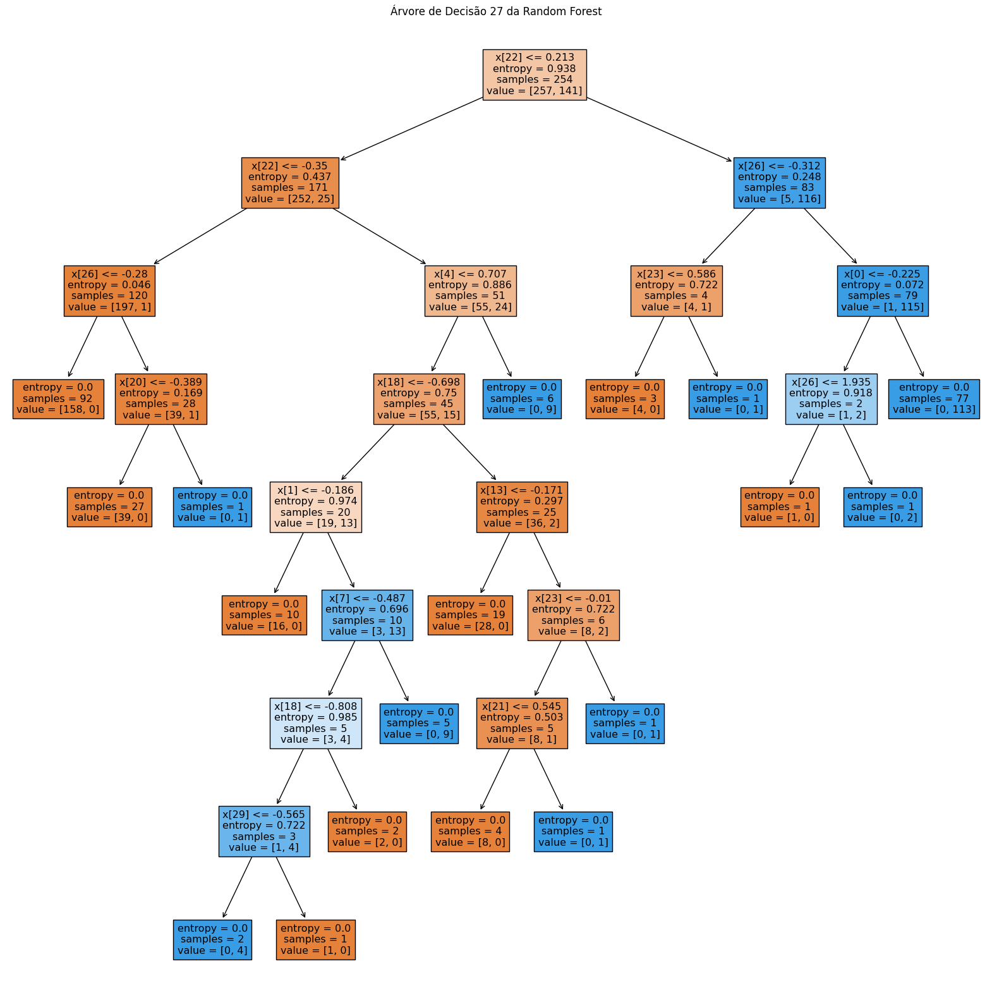

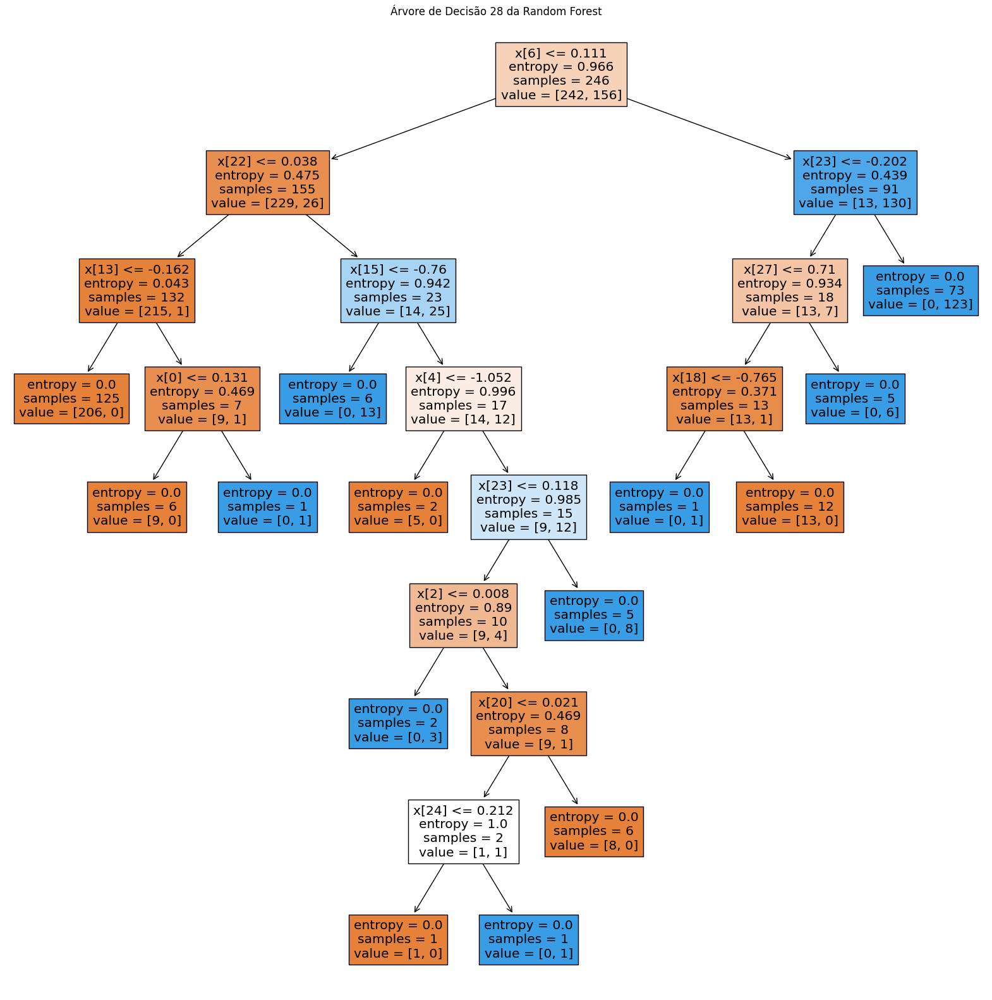

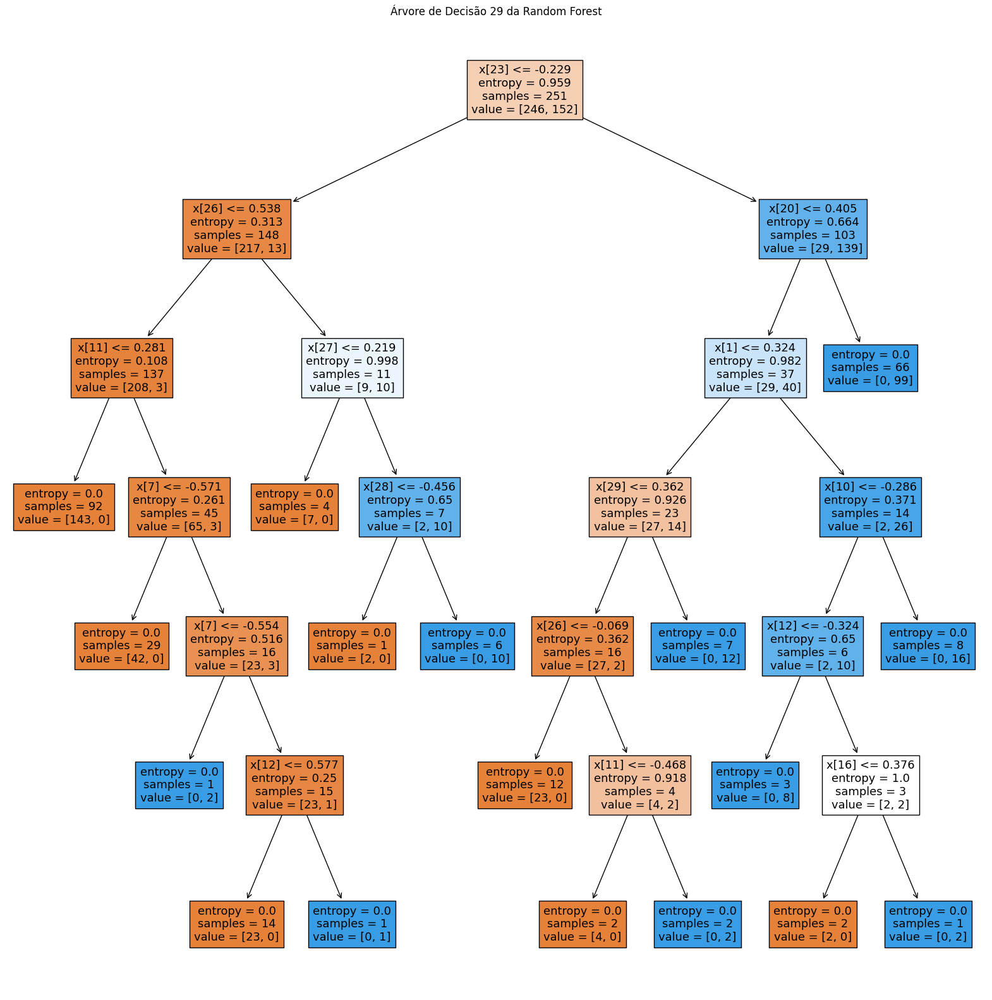

In [12]:
for i, tree in enumerate(best_rf):
    plt.figure(figsize=(20,20))
    plot_tree(tree, filled=True)
    plt.title(f"Árvore de Decisão {i} da Random Forest")
    plt.show()